### ***My housing research in Amsterdam. Not deep, but with pictures***

I'm going to visit Amsterdam for the first time in January 2024. I decided to apply my beginner skills in pandas to choose a optimal placement.

This notebook includes data preprocessing, analysis of the cost and types of housing in Amsterdam, as well as the creation of maps for the practice of analyzing geospatial data.

Data from 12.12.2023 was downloaded from the website:
http://insideairbnb.com/get-the-data/



## Loading data

In [ ]:
!pip install pysal
!pip install geoplot
! pip install IPython

In [2]:
import pandas as pd
import numpy as np
import geopandas as gpd
import re
import folium
import geoplot.crs as gcrs
import geoplot as gplt

In [3]:
import matplotlib.pyplot as plt
plt.style.use('dark_background')

In [4]:
from google.colab import files
from IPython.display import Image

Files on Drive:

https://drive.google.com/file/d/1-py4o523iw2XRKcAFfq0G7nTjHhBjFwQ/view?usp=sharing

https://drive.google.com/file/d/1_jSgGEwpwqLPtXPFc5f424kapY3N4Q7N/view?usp=sharing

In [ ]:
!gdown --id 1-py4o523iw2XRKcAFfq0G7nTjHhBjFwQ

In [193]:
df = pd.read_csv('/content/listings12.12.23.csv', usecols=['id', 'name', 'neighbourhood',
                                'latitude','longitude', 'room_type', 'price'])

In [53]:
df.head(2)

,id,name,neighbourhood,latitude,longitude,room_type,price
0,2818,Condo in Amsterdam · ★4.90 · 1 bedroom · 2 bed...,Oostelijk Havengebied - Indische Buurt,52.36435,4.94358,Private room,69.0
1,20168,Townhouse in Amsterdam · ★4.44 · 1 bedroom · 1...,Centrum-Oost,52.36407,4.89393,Private room,117.0


## Data preprocessing

The column "name" contains several features in one, it is necessary to separate it and remove text from cells

In [194]:
df[['name', 'rate', 'bedroom', 'bed', 'bath']] = df["name"].str.split(r"[·]", expand=True)

In [195]:
# determine rows with missed rate and the column data must be moved to the right

df['rate_flag'] = df["rate"].str.findall(r"★")
df['rate_flag'] = [''.join(map(str, l)) for l in df['rate_flag']]

In [196]:
df['rate_flag'].value_counts()

★    7311
     1428
Name: rate_flag, dtype: int64

In [57]:
df.head(1)

,id,name,neighbourhood,latitude,longitude,room_type,price,rate,bedroom,bed,bath,rate_flag
0,2818,Condo in Amsterdam,Oostelijk Havengebied - Indische Buurt,52.36435,4.94358,Private room,69.0,★4.90,1 bedroom,2 beds,1.5 shared baths,★


In [197]:
# move the data if it's necessary

df['bedrooms'] = df.apply(lambda x: x['rate'] if (x['rate_flag'] == '') else x['bedroom'], axis=1)
df['beds'] = df.apply(lambda x: x['bedroom'] if (x['rate_flag'] == '') else x['bed'], axis=1)
df['bathrooms'] = df.apply(lambda x: x['bed'] if (x['rate_flag'] == '') else x['bath'], axis=1)
df['rating'] = df.apply(lambda x: 'no_info' if (x['rate_flag'] == '') else x['rate'], axis=1)

In [198]:
df = df.drop(['rate', 'bedroom', 'bed', 'bath', 'rate_flag'], axis=1)

In [199]:
# determine placements with a shared bathroom

df['shared_bath'] = df['bathrooms'].str.contains('shared')
df['shared_bath'] = df['shared_bath']*1

In [200]:
df['bedrooms'] = df['bedrooms'].str.replace(' Studio', '0').replace(r"[^\d+]", "", regex=True)
df['bedrooms'] = df['bedrooms'].astype(int)

In [201]:
df[df['beds'].isnull()]

,id,name,neighbourhood,latitude,longitude,room_type,price,bedrooms,beds,bathrooms,rating,shared_bath
4483,48132257,Camper/RV in Amsterdam,Westerpark,52.39731,4.88375,Entire home/apt,100.0,0,None,None,★4.67,NaN


In [ ]:
df['beds'] = df['beds'].str.replace('1.5', '1 ').str.replace(r"[^\d+]", "", regex=True).fillna('0')
df['beds'] = df['beds'].astype(int)

In [157]:
df['beds'].value_counts()

1     4795
2     2301
3      871
4      510
5      140
6       69
7       14
8        8
12       6
16       3
24       3
0        3
22       2
14       2
13       2
11       2
10       2
26       1
20       1
17       1
33       1
18       1
30       1
Name: beds, dtype: int64

I want to know what kind of placement with 30 beds is

In [67]:
df[df['beds']>20]

,id,name,neighbourhood,latitude,longitude,room_type,price,bedrooms,beds,bathrooms,rating,shared_bath
47,307497,Boat in Amsterdam,Westerpark,52.391850,4.886900,Entire home/apt,1233.0,10,26,2.5,★4.86,0
131,742160,Boat in Amsterdam,Centrum-Oost,52.368660,4.920710,Entire home/apt,557.0,8,22,2.5,★4.78,0
2758,25698586,Houseboat in Amsterdam,Oud-Noord,52.400460,4.892790,Entire home/apt,900.0,10,33,3.0,★4.23,0
3894,39725240,Boat in Amsterdam,Oud-Noord,52.401080,4.893290,Entire home/apt,817.0,8,24,5.5,★4.89,0
5322,612289973482163299,Boat in Amsterdam,Oud-Noord,52.399950,4.888400,Entire home/apt,2632.0,7,22,2.0,no_info,0
5503,643315499225242586,Boat in Amsterdam,Oud-Noord,52.399930,4.891570,Entire home/apt,2602.0,17,30,17.0,no_info,0
8287,991732630720429296,Boat in Amsterdam,Noord-Oost,52.377100,4.976570,Entire home/apt,1021.0,8,24,5.5,no_info,0
8372,1000493452038041581,Boat in Amsterdam,Westerpark,52.392046,4.886623,Entire home/apt,1407.0,8,24,5.5,★New,0


It became clear, this is a ship. I'll upload photos below.

It's on Airbnb:

https://www.airbnb.com/rooms/643315499225242586?check_in=2024-01-25&check_out=2024-01-26&source_impression_id=p3_1703866448_XKDIXYd4j%2Fz2NRp7&previous_page_section_name=1000&federated_search_id=e6c95cd6-15fd-4d25-97ba-08dcf006d55a

In [ ]:
uploaded1 = files.upload()

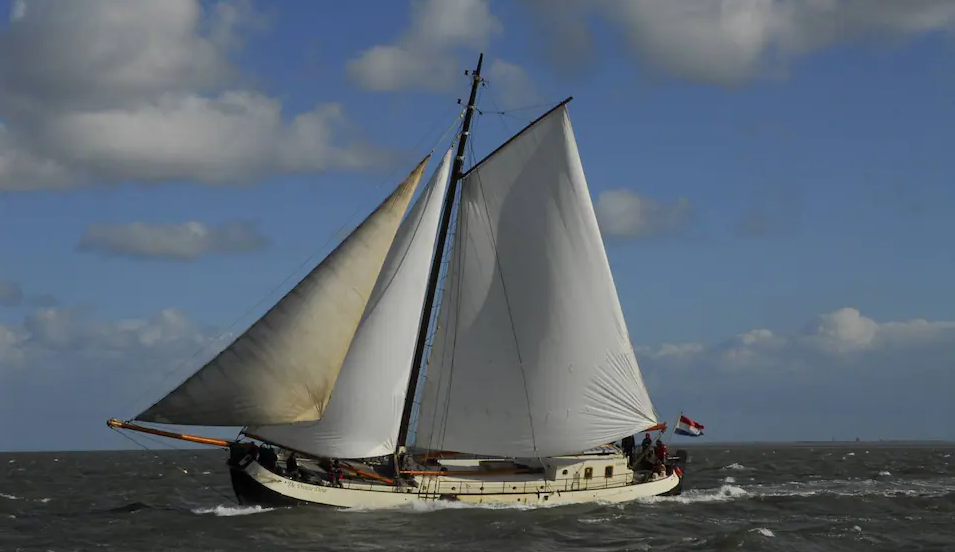

In [ ]:
Image('boat.png', width = 500)

In [ ]:
uploaded2 = files.upload()

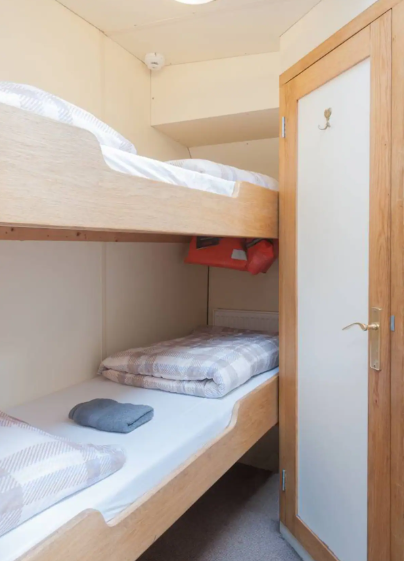

In [31]:
Image('beds.png', width = 300)

Continue clearing the data

In [203]:
df['bathrooms'] = df['bathrooms'].str.replace(r"[^\d+\.]", "", regex=True).replace('', '0').fillna('0')
df['bathrooms'] = df['bathrooms'].astype(float)

In [204]:
df['rating'] = df['rating'].map(lambda x: x.lstrip(' ★'))

In [211]:
df['rating'] = df[(df['rating'] != 'no_info')&(df['rating'] != 'New ')]['rating'].astype(float)

In [205]:
df['shared_bath'] = df['shared_bath'].fillna('-')

In [212]:
df.dtypes

id                 int64
name              object
neighbourhood     object
latitude         float64
longitude        float64
room_type         object
price            float64
bedrooms           int64
beds               int64
bathrooms        float64
rating           float64
shared_bath       object
dtype: object

## Data analysis

In [22]:
df.head(2)

,id,name,neighbourhood,latitude,longitude,room_type,price,bedrooms,beds,bathrooms,rating
0,2818,Condo in Amsterdam,Oostelijk Havengebied - Indische Buurt,52.36435,4.94358,Private room,69.0,1,2,1.5,4.90
1,20168,Townhouse in Amsterdam,Centrum-Oost,52.36407,4.89393,Private room,117.0,1,1,1.0,4.44


In [190]:
df.isna().mean()

id               0.000000
name             0.000000
neighbourhood    0.000000
latitude         0.000000
longitude        0.000000
room_type        0.000000
price            0.033871
bedrooms         0.000000
beds             0.000000
bathrooms        0.000000
rating           0.000000
shared_bath      0.000000
dtype: float64

In [191]:
df.id.nunique()

8739

In [213]:
df['rating'].mean()

4.833639570777598

<Axes: >

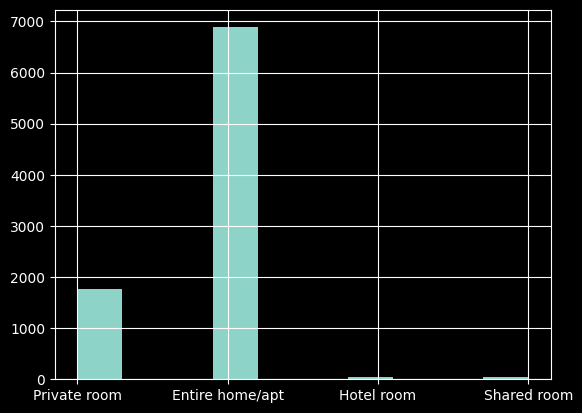

In [26]:
df['room_type'].hist()

In [121]:
df.price.describe()

count     8443.000000
mean       251.160725
std        421.177934
min         10.000000
25%        144.000000
50%        200.000000
75%        297.000000
max      25457.000000
Name: price, dtype: float64

According to the first analysis operations, I can say:

* There are 8,739 places to stay in Amsterdam;
* Most of them have type "Entire home/apt";
* The price varies from 10  to 25457 dollars per night;
* The median price per night is $200 and the average housing rating is 4.83.

Cool.

I decided to look at which housing costs more than 25 thousand dollars per night






In [83]:
df[df['price']>20000]

,id,name,neighbourhood,latitude,longitude,room_type,price,bedrooms,beds,bathrooms,rating,shared_bath
7283,897037429506065313,Rental unit in Amsterdam,Oud-Noord,52.39993,4.89513,Entire home/apt,25457.0,3,3,4.0,NaN,0



**Wow! It's a crane! Very interesting placement.**

Photos below.

It's on Airbnb:

https://www.airbnb.com/rooms/897037429506065313?location=Amsterdam%2C%20Netherlands&check_in=2024-01-26&check_out=2024-01-27&source_impression_id=p3_1703866271_1HtrItF5GmKCS%2BKB&previous_page_section_name=1001&federated_search_id=aad37f0d-7267-42be-96c8-51483a184624

In [ ]:
uploaded3 = files.upload()
uploaded4 = files.upload()

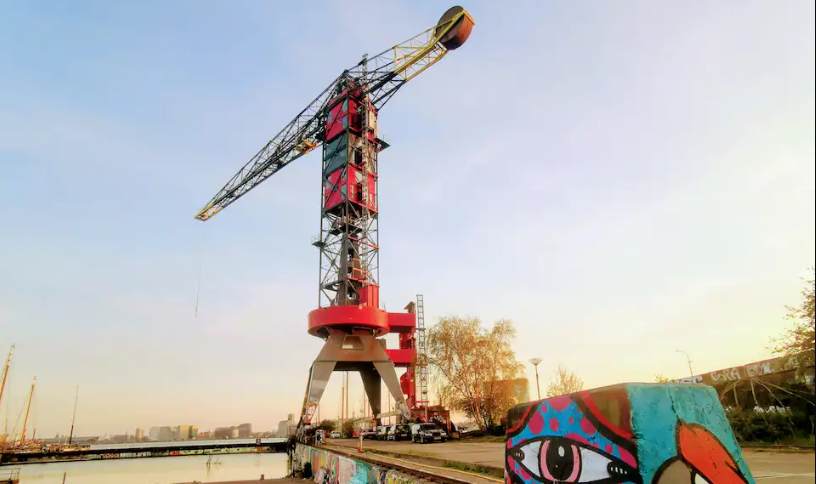

In [ ]:
Image('crane.png', width = 500)

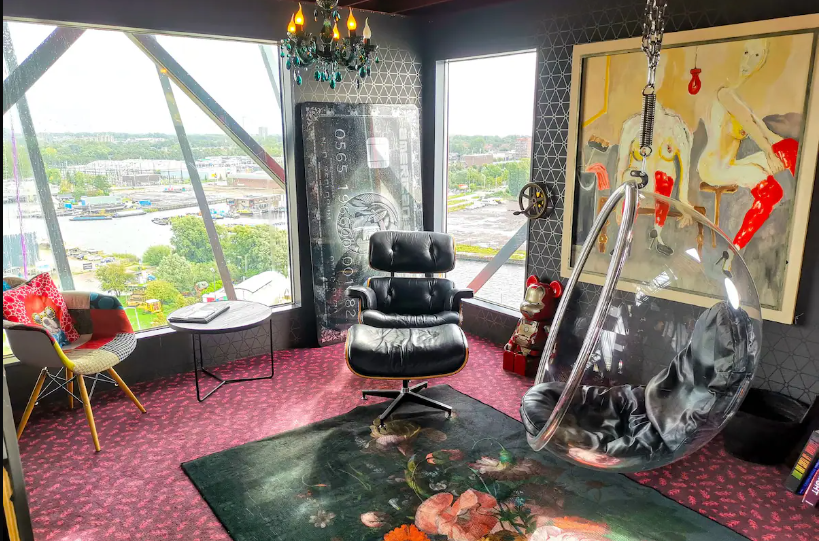

In [ ]:
Image('crane_studio.png', width = 500)

Continue to consider housing prices.

Let's look at the distribution of the price per night, without taking into account the placement on the crane

In [32]:
np.nanquantile(df['price'], 0.95)

500.0

In [33]:
q1 = df['price'].quantile(0.01)
q2 = df['price'].quantile(0.98)

<Axes: >

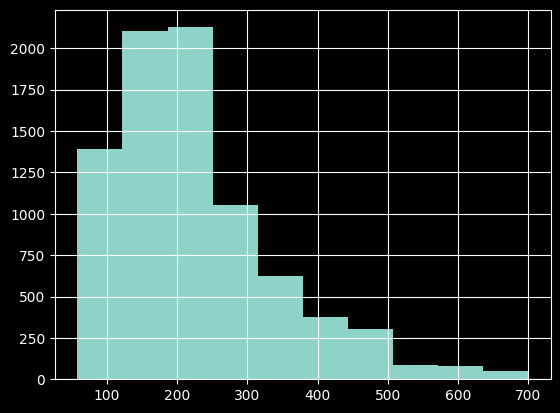

In [223]:
df[df['price'].between(q1, q2)]['price'].hist()

In [236]:
t = df.groupby(['room_type', 'shared_bath'])['price'].agg(['count', 'mean']).reset_index()

In [245]:
# formatting by cost

t.style.applymap(
     lambda x: 'background-color : green' if x<170.0 else '',
     subset=['mean'])

,room_type,shared_bath,count,mean
0,Entire home/apt,0,6564,274.633608
1,Entire home/apt,-,53,211.943396
2,Hotel room,0,38,163.078947
3,Hotel room,1,7,158.142857
4,Hotel room,-,7,252.000000
5,Private room,0,1194,194.717755
6,Private room,1,489,106.343558
7,Private room,-,47,164.680851
8,Shared room,1,43,121.930233
9,Shared room,-,1,76.000000


Important requirements when choosing a housing are the price and conditions, for example, I choose without a shared bathroom. Based on this pivot table I see that there are minimum 38 suitable options of 'Hotel room' type.
But this data is not enough. I decide to add the neighbourhood and the rating of residents of course

In [ ]:
t2 = df.groupby(['neighbourhood', 'room_type'])['price', 'rating'].agg({'price':['count', 'mean'], 'rating':'mean'}).reset_index()

In [243]:
t2.columns = ['_'.join(col).strip() for col in t2.columns.values]

In [244]:
t2.style.applymap(
     lambda x: 'background-color : orange' if x<120.0 else '',
     subset=['price_mean']).applymap(
     lambda x: 'background-color : orange' if x>4.700 else '',
     subset=['rating_mean'])

,neighbourhood_,room_type_,price_count,price_mean,rating_mean
0,Bijlmer-Centrum,Entire home/apt,23,162.826087,4.801053
1,Bijlmer-Centrum,Private room,23,118.826087,4.737143
2,Bijlmer-Oost,Entire home/apt,21,193.714286,4.879286
3,Bijlmer-Oost,Private room,16,88.562500,4.693077
4,Bos en Lommer,Entire home/apt,380,206.000000,4.853555
5,Bos en Lommer,Private room,41,103.731707,4.806667
6,Bos en Lommer,Shared room,3,66.000000,4.370000
7,Buitenveldert - Zuidas,Entire home/apt,72,214.180556,4.843922
8,Buitenveldert - Zuidas,Private room,32,1196.843750,4.790000
9,Centrum-Oost,Entire home/apt,531,321.721281,4.840303


That's all.

Based on this analysis, evaluation of available dates and photos, I made my choice in favor of a 'Private room' in a hotel in Osdorp.
The effectiveness of the analysis based on the criterion of achieving the goal will be done after the trip :)

## Geospatial analysis

It's a bonus even for me

In [247]:
# convert df to Geopandas
df_gpd = gpd.GeoDataFrame(df, geometry=gpd.points_from_xy(df.longitude, df.latitude, crs=4326))

In [248]:
df_gpd.head(2)

,id,name,neighbourhood,latitude,longitude,room_type,price,bedrooms,beds,bathrooms,rating,shared_bath,geometry
0,2818,Condo in Amsterdam,Oostelijk Havengebied - Indische Buurt,52.36435,4.94358,Private room,69.0,1,2,1.5,4.90,1,POINT (4.94358 52.36435)
1,20168,Townhouse in Amsterdam,Centrum-Oost,52.36407,4.89393,Private room,117.0,1,1,1.0,4.44,0,POINT (4.89393 52.36407)


<GeoAxes: >

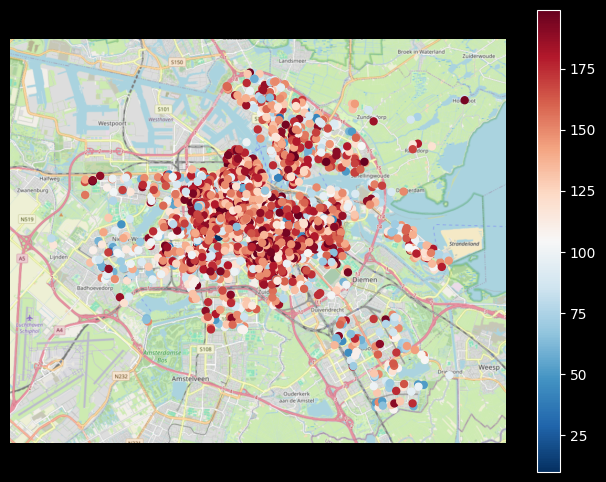

In [251]:
# points map

ax = gplt.webmap(df_gpd.query('price < 200'), projection=gcrs.WebMercator())
gplt.pointplot(df_gpd.query('price < 200'), cmap='RdBu_r', ax=ax, hue= 'price', legend=True)

In [ ]:
! gdown --id 1_jSgGEwpwqLPtXPFc5f424kapY3N4Q7N

In [252]:
# reading geojson

geofile = '/content/neighbourhoods.geojson'
df_geo = gpd.read_file(geofile)
df_geo = df_geo.to_crs(4326)

In [254]:
df_geo

,neighbourhood,neighbourhood_group,geometry
0,Bijlmer-Oost,None,"MULTIPOLYGON Z (((4.99167 52.32444 0.00000, 4...."
1,Noord-Oost,None,"MULTIPOLYGON Z (((5.07916 52.38865 0.00000, 5...."
2,Noord-West,None,"MULTIPOLYGON Z (((4.93072 52.41161 0.00000, 4...."
3,Oud-Noord,None,"MULTIPOLYGON Z (((4.95242 52.38983 0.00000, 4...."
4,IJburg - Zeeburgereiland,None,"MULTIPOLYGON Z (((5.03906 52.35458 0.00000, 5...."
5,Centrum-West,None,"MULTIPOLYGON Z (((4.90640 52.38004 0.00000, 4...."
6,Oostelijk Havengebied - Indische Buurt,None,"MULTIPOLYGON Z (((4.96131 52.35913 0.00000, 4...."
7,Centrum-Oost,None,"MULTIPOLYGON Z (((4.93297 52.37041 0.00000, 4...."
8,Oud-Oost,None,"MULTIPOLYGON Z (((4.93743 52.35774 0.00000, 4...."
9,Watergraafsmeer,None,"MULTIPOLYGON Z (((4.96971 52.35636 0.00000, 4...."


# Use folium

In [264]:
# create clip levels and bin colors for prices

from numpy import Inf
df['price_bins']= pd.cut(df.price,
       bins= [-Inf, 100, 200, 350, 400, Inf],
       labels= ['0-100', '100-200', '200-300', '300-400', '400+'])


df['colors'] = df.price_bins.map({'0-100':'blue', '100-200':'gold', '200-300':'orange', '300-400':'red', '400+':'black'})

In [258]:
df.head(2)

,id,name,neighbourhood,latitude,longitude,room_type,price,bedrooms,beds,bathrooms,rating,shared_bath,price_bins,colors
0,2818,Condo in Amsterdam,Oostelijk Havengebied - Indische Buurt,52.36435,4.94358,Private room,69.0,1,2,1.5,4.90,1,0-100,blue
1,20168,Townhouse in Amsterdam,Centrum-Oost,52.36407,4.89393,Private room,117.0,1,1,1.0,4.44,0,100-200,gold


In [259]:
m = folium.Map(location= [4.82043, 52.41161], zoom_start=10)
for lat, lon, ptcolor in zip(df.latitude, df.longitude, df.colors):
  folium.CircleMarker(
     location=[lat, lon],
     radius=1.5,
     opacity=0.5,
     color=ptcolor,
     fill=True,
     fill_color=ptcolor,
  ).add_to(m)

In [260]:
from folium import plugins

data = df[['latitude','longitude', 'price']].values
data =data.tolist()

In [261]:
data = np.nan_to_num(data)

In [262]:
# create heat map

hm = plugins.HeatMap(data,gradient={0.1: 'blue', 0.2: 'lime', 0.4: 'yellow', 0.6: 'orange', 0.9: 'red'},
                min_opacity=0.1,
                max_opacity=0.9,
                radius=20,
                use_local_extrema=False)

In [265]:
# add to base map

hm.add_to(m);
m

In [266]:
# add a choropleth layer

folium.Choropleth(
    geo_data=df_geo,
    name="choropleth",
    data=df,
    columns=["neighbourhood", "price"],
    key_on="feature.properties.neighbourhood",
    fill_color="RdBu_r",
    fill_opacity=0.5,
    legend_name="Prices",
).add_to(m)

In [267]:
m